# Object Detection with YOLO
- YOLO is short for You Only Look Once.
- It is a family of single-stage deep learning-based object detectors.
- They are capable of more than real-time object detection with state-of-the-art accuracy.

## Comparison of YOLO Models

| Model | Year | Focus | Advantages | Disadvantages |
|---|---|---|---|---|
| YOLOv1 | 2015 | Real-time Object Detection | Fast, Single Stage Detection | Lower Accuracy compared to two-stage detectors |
| YOLOv2 | 2016 | Improved Accuracy | Batch Normalization, High-Resolution Classification | Slower than YOLOv1 |
| YOLOv3 | 2018 | Balancing Speed and Accuracy | Feature Pyramid Networks (FPNs) for Multi-Scale Detection, Object Classification Improvements | More Complex Architecture |
| YOLOv4 | 2020 | Flexibility and Customization | Supports different backbones (CSPDarknet53), Mish activation function | More Complex than YOLOv3 |
| YOLOv5 | 2020 | Focus on Efficiency and User-friendliness | Focus Modules, Object Detection and Segmentation Capabilities | Less Customization compared to YOLOv4 |
| YOLOX | 2021 | High Performance, Anchor-Free Design | Focuses on decoupled head (classification and bounding box prediction) for faster inference, SimOTA loss for better box quality | Limited Customization options |
| YOLOv6 | 2022 | Real-time Object Detection and Strong Performance  | Focuses on both speed and accuracy, EfficientDet-inspired neck for multi-scale feature fusion | Less widely used compared to previous versions |
| YOLOv7 | 2023 | The fastest object detection algorithm | Claimed significant speed and accuracy improvements, Sparse attention mechanism  | Very new, limited benchmarks available |

**Additional Notes:**

* Each YOLO version typically offers different model sizes (e.g., YOLOv5s, YOLOv5m, YOLOv5l, YOLOv5x) with a trade-off between speed and accuracy.
* Newer YOLO models often build upon the improvements of previous versions.
* The choice of YOLO model depends on your specific needs. If real-time speed is crucial, you might prioritize YOLOv1, YOLOv5 Nano, or YOLOv6 Tiny. If maximizing accuracy is essential, you might choose YOLOv7 or YOLOv8 (if benchmarks become available).
* YOLOv5n (nono) a small version that's suitable for mobile devices

## Steps to  Be Followed:

1. Importing the necessary libraries
2. Defining the hyperparameter values
3. Defining a helper function to download files
4. Pulling the data from Roboflow (the official data provider for YOLO)
5. Cloning the **YOLOv5** repository
6. Creating a directory to store results
7. Running the model
8. Defining a function to show validation predictions saved during training
9. Defining a helper function for inference on images
10. Visualizing inference images






### Step 1: Importing the Necessary Libraries
- Import the **os** module for operating system-related functionalities
- Import the **glob** module for file path pattern matching
- Import the **matplotlib.pyplot** module for plotting
- Import the **OpenCV** module for image processing
- Import the **requests** module for making HTTP requests


In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests


### Step 2: Defining the Hyperparameter Values
- Define the number of epochs to train

In [2]:
TRAIN = True
EPOCHS = 5

__Observations:__

The code specifies that the training will be conducted over a total of 5 epochs.

### Step 3: Defining a Helper Function to Download Files
- Download a file from the provided URL and save it with the specified name
- Send an HTTP GET request to the URL to download the file
- Write the content of the response to a file using the given name
- If the file already exists, display a message indicating that the download has been skipped


In [5]:
def download_file(url, save_name):
  if not os.path.exists(save_name):
    file = requests.get(url)
    print("File doesn't exist. Downloading")
    open(save_name, 'wb').write(file.content)
  else:
    print("File already exists. no need to download")



### About the dataset
- The dataset comprises images depicting different vehicles in diverse traffic conditions. These images have been sourced from the Open Image dataset.
- In total, the dataset consists of 5 classes, namely: Car, Bus, Motorcycle, Truck, and Ambulance.

### Step 4: Pulling the data from Roboflow

-  If the **train** directory doesn't exist, download the dataset zip file from the specified URL using curl
- Unzip the downloaded file and remove the zip file after extraction
- Create a list of directory names: **train, valid, test**
- Iterate over each directory name and its corresponding index
- Get a sorted list of all image names in the current directory
- Iterate over each image name and its corresponding index
- If the index is even (i.e., every second image), extract the file name without the extension
- Remove the image file
- Remove the corresponding label file


In [6]:
if not os.path.exists('train'):

    !/usr/bin/curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
    dirs = ['train', 'valid', 'test']
    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:
                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")
                os.remove(f"{dir_name}/labels/{file_name}.txt")


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   2835      0 --:--:-- --:--:-- --:--:--  2843
100 38.4M  100 38.4M    0     0  38.2M      0  0:00:01  0:00:01 --:--:--  236M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extractin

**Observations:**

The code block downloads a dataset, extracts it, and selectively removes certain image and label files from the directories.

### Step 5: Cloning the YOLOv5 Repository
- If the **YOLOv5** directory does not exist, clone the **YOLOv5** repository from the provided GitHub URL
- Change the current working directory to **YOLOv5**
- Install the necessary Python packages listed in the **requirements.txt** file


In [7]:
if not os.path.exists('yolov5'):

    !git clone https://github.com/ultralytics/yolov5.git

%cd yolov5/

!pip3 install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 15845, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 15845 (delta 31), reused 33 (delta 7), pack-reused 15769
Receiving objects: 100% (15845/15845), 14.60 MiB | 26.27 MiB/s, done.
Resolving deltas: 100% (10845/10845), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.6/605.6 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.8 MB/s eta 0:00:00


**Observations:**

The code block checks for the presence of the **YOLOv5** project directory clones it, if necessary, sets it as the current working directory, and installs the required dependencies.

### Step 6: Creating a Directory to Store Results
- Set the directory to store results based on the current number of result directories
- Count the number of result directories in the **runs/train** directory, if the **TRAIN** variable is **True** (assuming it's defined outside this function) then set the result directory name with an incremented count
- Else, set the result directory name without incrementing the count
- Return the name of the result directory


In [8]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

### Step 7: Running the Model
- Set the **RES_DIR** variable by calling the **set_res_dir()** function
- If the **TRAIN** variable is **True**, execute the **train.py** script with the specified command-line arguments


In [9]:
RES_DIR = set_res_dir()
if TRAIN:
    # VOC: python3
    !python3 train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}



Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-198-g34c2187 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t

**Observations:**

The code sets a results directory using **set_res_dir()**. If **TRAIN** is **True**, it executes a **YOLOv5** training command with specific arguments, saving the results in the results directory.

### Step 8: Defining a Function to Show Validation Predictions Saved During Training
- List the contents of the **runs/train/{RES_DIR}** directory
- Set the **EXP_PATH** variable as the path to the result directory
- Get a list of paths to predicted images in the result directory
- Print the list of predicted image paths
- Iterate over each predicted image path
- Read the image using **OpenCV**
- Create a figure with a specific size
- Display the image (converting BGR to RGB) and turn off the axes
- Show the image


In [10]:
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

### Step 9: Defining a Helper Function for Inference on Images
- Perform inference on images using the specified result directory.
- Create a directory to store inference results.
- Count the number of inference detection directories
- Set the inference detection directory name with an incremented count
- Execute the **detect.py** script with the specified command-line arguments.
- Return the name of the inference detection directory


In [11]:
def inference(RES_DIR, data_path):

    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)

    !python3 detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

### Step 10: Visualizing Inference Images
- Perform inference on images using the specified result directory
- create a directory to store inference results
- Count the number of inference detection directories
- Set the inference detection directory name with an incremented count
- Execute the **detect.py** script with the specified command-line arguments and return the name of the inference detection directory



In [ ]:
def visualize(INFER_DIR):

    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png			       results.png
events.out.tfevents.1654599171.jupyter.1587.0  train_batch0.jpg
F1_curve.png				       train_batch1.jpg
hyp.yaml				       train_batch2.jpg
labels_correlogram.jpg			       val_batch0_labels.jpg
labels.jpg				       val_batch0_pred.jpg
opt.yaml				       val_batch1_labels.jpg
P_curve.png				       val_batch1_pred.jpg
PR_curve.png				       val_batch2_labels.jpg
R_curve.png				       val_batch2_pred.jpg
results.csv				       weights
['runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch2_pred.jpg']


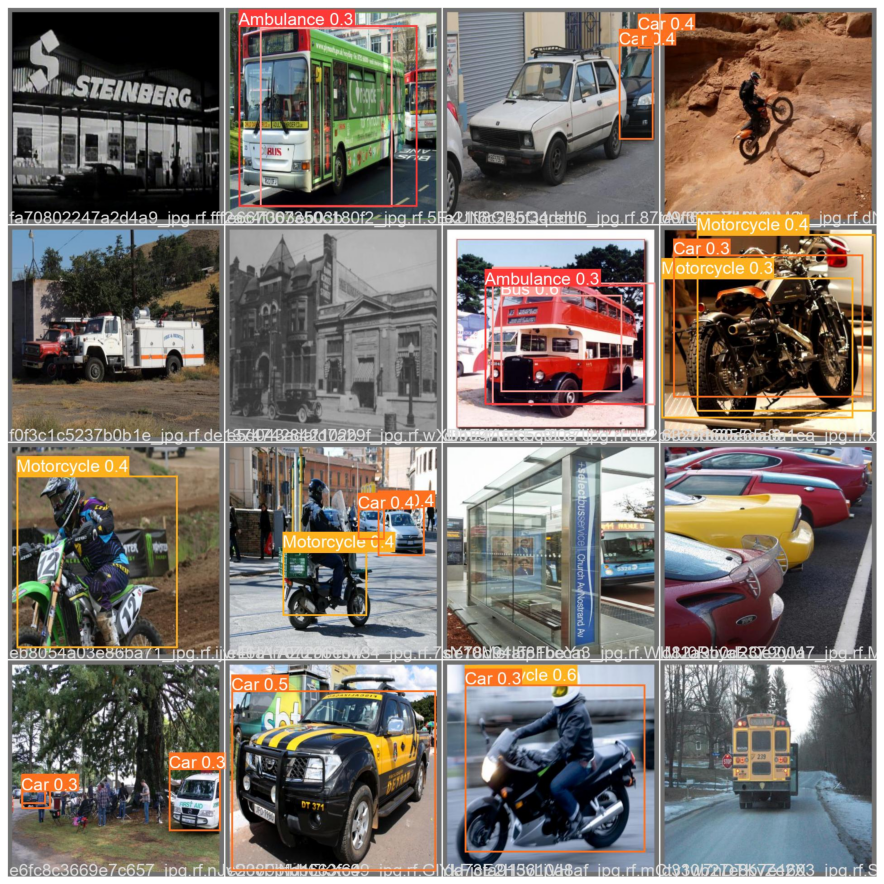

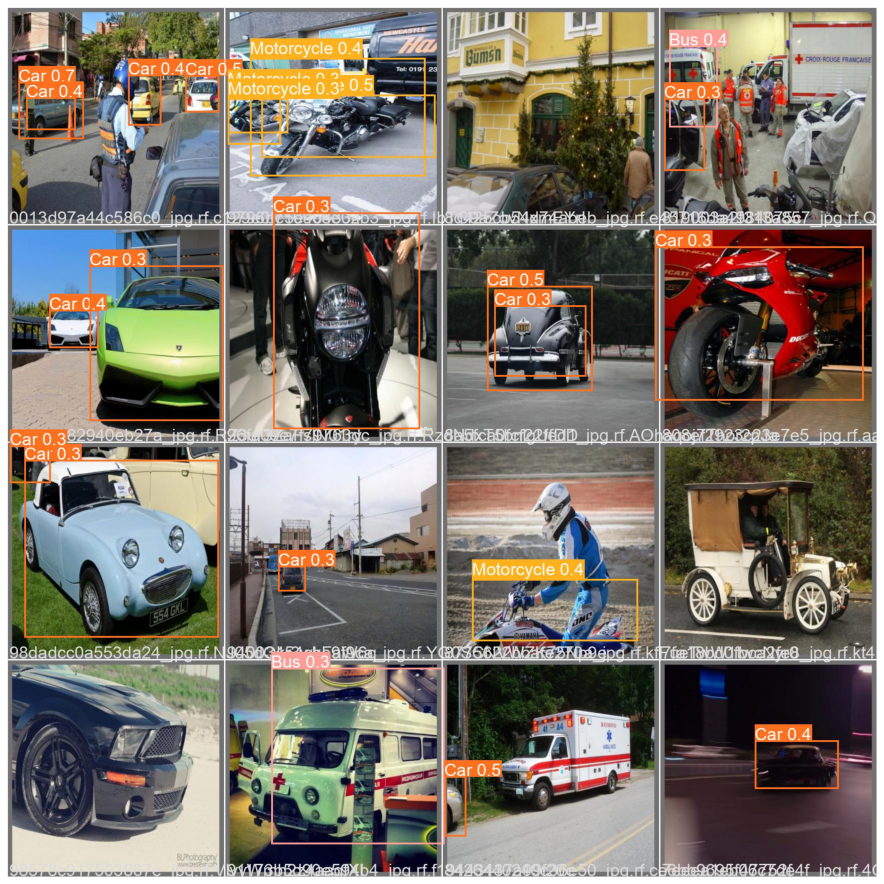

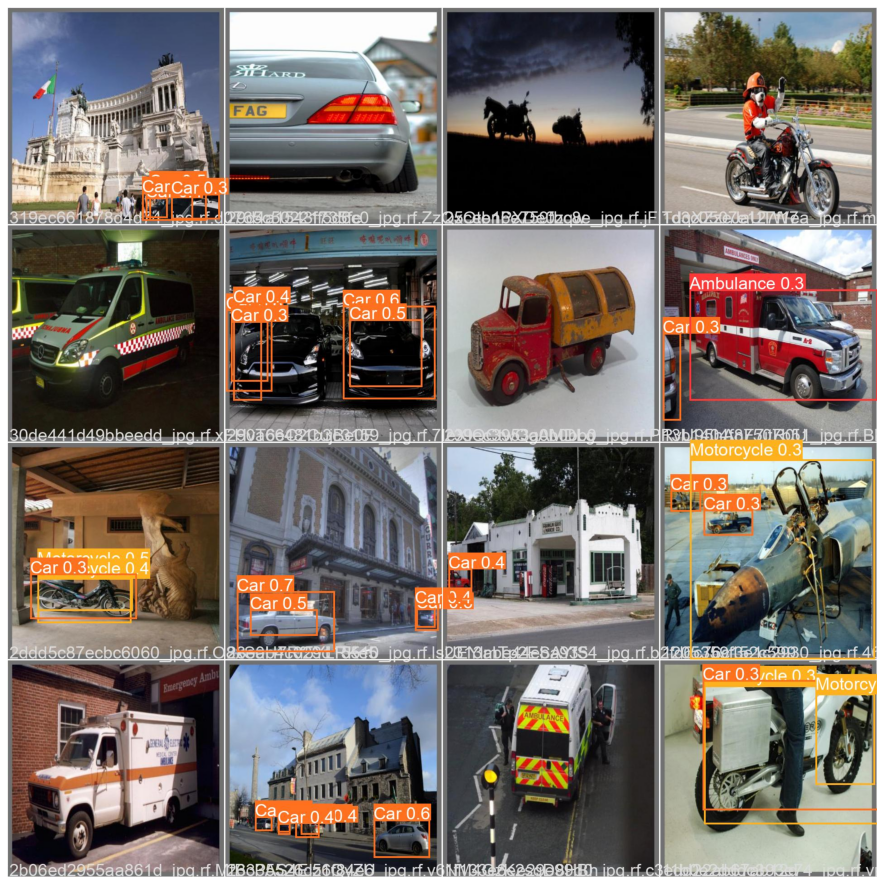

In [ ]:
show_valid_results(RES_DIR)

**Observations:**

The code defines a function that retrieves inference images from a specified directory, loads, and visualizes each image using OpenCV and Matplotlib, respectively, and displays them.

#### Downloading the Inference Data File
- If the **inference_images** directory doesn't exist, extract the contents of the **inference_data.zip** file
- Else, print a message indicating that the dataset is already present


In [ ]:
download_file('https://learnopencv.s3.us-west-2.amazonaws.com/yolov5_inference_data.zip',
              'inference_data.zip')
if not os.path.exists('inference_images'):
    !unzip -q "inference_data.zip"
else:
    print('Dataset already present')

#### Inference on Images
- Call the **inference** function with arguments **RES_DIR** and **inference_images**
- Assign the output to the variable **IMAGE_INFER_DIR**


In [ ]:
IMAGE_INFER_DIR = inference(RES_DIR, 'inference_images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_1/weights/best.pt'], source=inference_images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-246-g2dd3db0 Python-3.7.13 torch-1.10.2+cu102 CUDA:0 (NVIDIA Tesla V100-SXM2-16GB, 16160MiB)

Fusing layers... 
Model summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/4 /home/labsuser/yolov5/inference_images/image_1.jpg: 448x640 3 Cars, Done. (0.009s)
image 2/4 /home/labsuser/yolov5/inference_images/image_2.jpg: 416x640 2 Cars, Done. (0.009s)
image 3/4 /home/labsuser/yolov5/inference_images/image_3.jpg: 448x640 1 Bus, 1 

#### Visualizing the Inference Results
- Invoke **visualize** function and pass the variable **IMAGE_INFER_DIR** as an argument
- The visualize function displays the contents of the directory or file represented by the **IMAGE_INFER_DIR** variable

['runs/detect/inference_1/image_3.jpg', 'runs/detect/inference_1/image_1.jpg', 'runs/detect/inference_1/image_4.jpg', 'runs/detect/inference_1/image_2.jpg']


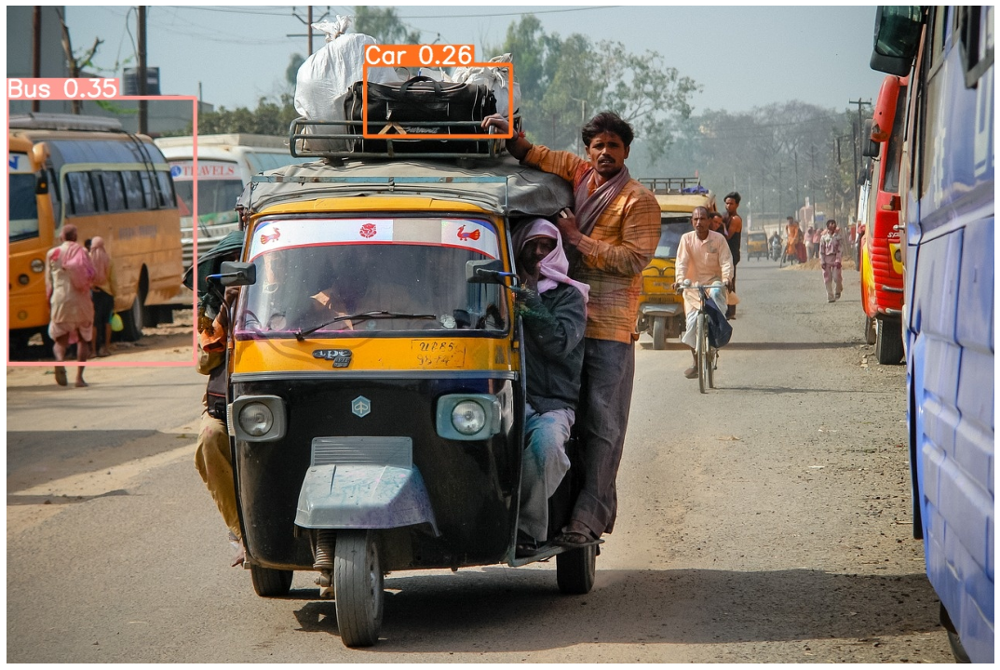

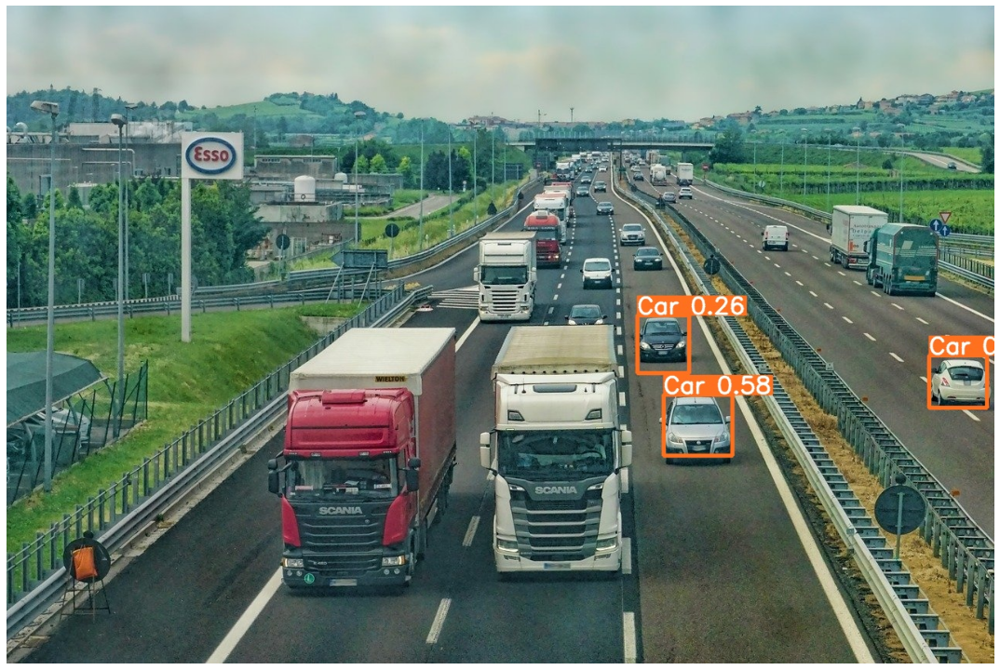

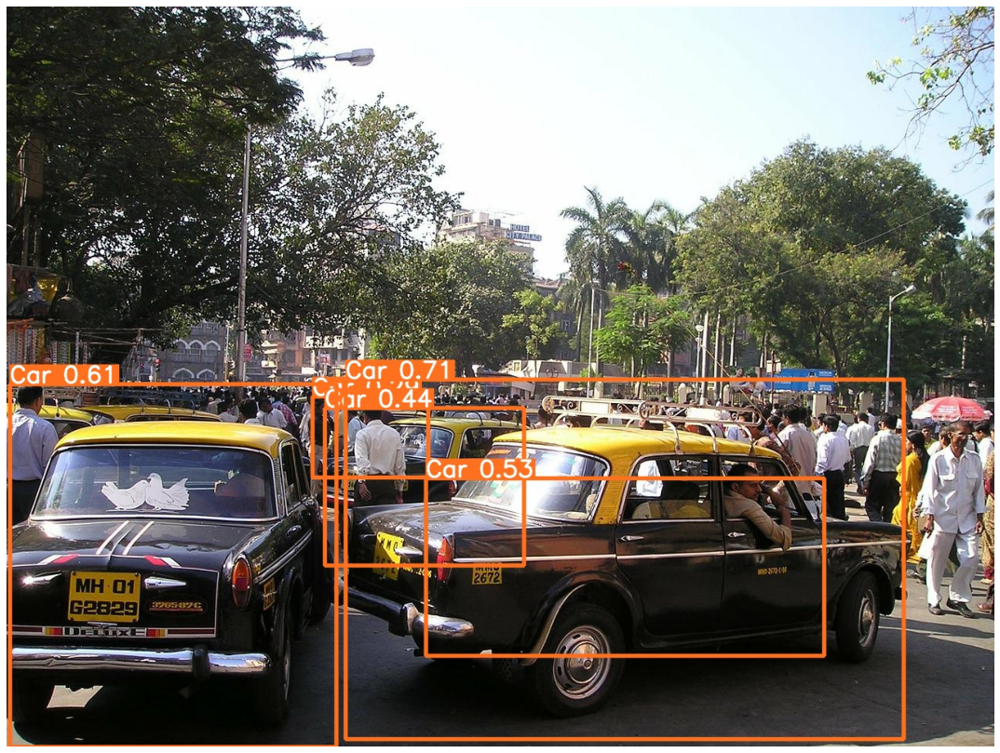

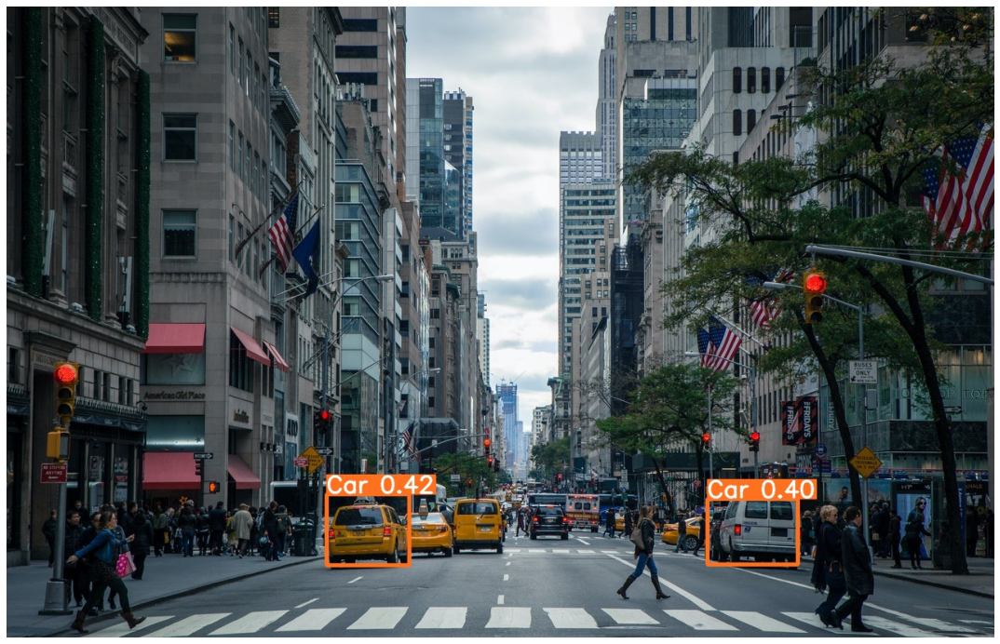

In [ ]:
visualize(IMAGE_INFER_DIR)

**Observations:**

 The content associated with the directory or file is displayed.